# Ocean Mass Manuscript - Extra Figures

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')


In [2]:

import xarray as xr
import pandas as pd
import numpy as np
import string


# plotting
from cartopy import crs as ccrs , feature as cfeature
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colors import ListedColormap
from matplotlib import colors
import cmocean as cm
from cmcrameri import cm as cmf


# user defined functions
# import sys
#sys.path.append("/Users/ccamargo/Desktop/public_OM/scripts/")
import utils_OM as om

import warnings
warnings.filterwarnings("ignore")


In [3]:
#%% define plotting preferences
cmap_unc=cm.cm.curl
path_to_figures = '../figures/extras/'

dpi=300
wi=20;hi=15
dimlat=180;dimlon=360
fontsize=25
ticksize=20

letters = list(string.ascii_lowercase)
landcolor='darkgrey'

# make our color scale
col_dict={1:"black", # WN
          2:"palegoldenrod", # PL
          3:"lightpink", # PLWN
          4:"orange", # AR1
          5:"teal", # Ar5
          6:"darkmagenta", # AR9
          7:"skyblue", # ARf
          8:"crimson" # GGM
          }

# We create a colormar from our list of colors
cmapnm = ListedColormap([col_dict[x] for x in col_dict.keys()])


In [4]:
#%% load data
t0=2003;t1=2016
t0_a=1993;t1_a=2016
path='../data/output/'

ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))
ds_a=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0_a,t1_a))

lon=np.array(ds.lon)
lat=np.array(ds.lat)
X=np.array(lon);X[-1]=360
Y=np.array(-lat)



#% % mask
mask=xr.open_dataset(path+'../LAND_MASK.CRI_360x180.nc')
# mask.land_mask.plot()
mask=mask.sortby('lat',ascending=False)
oceanmask=np.array(mask.land_mask)
oceanmask[oceanmask>0]=np.nan
oceanmask[oceanmask==0]=1


# Uncertainty breakdown overview - All datasets
## 2003-2016

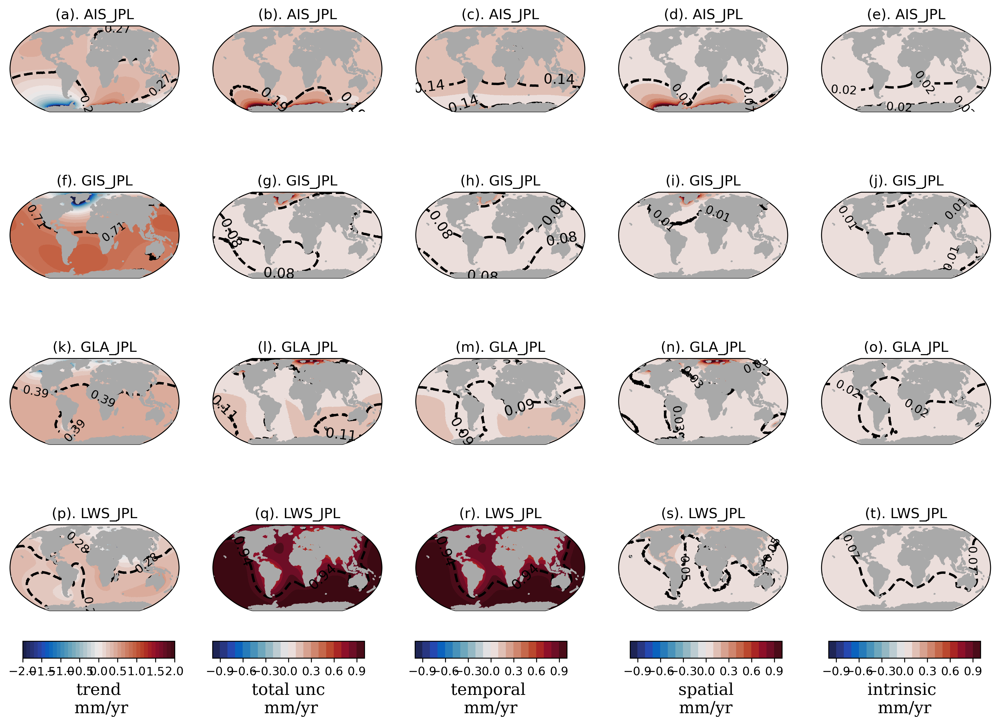

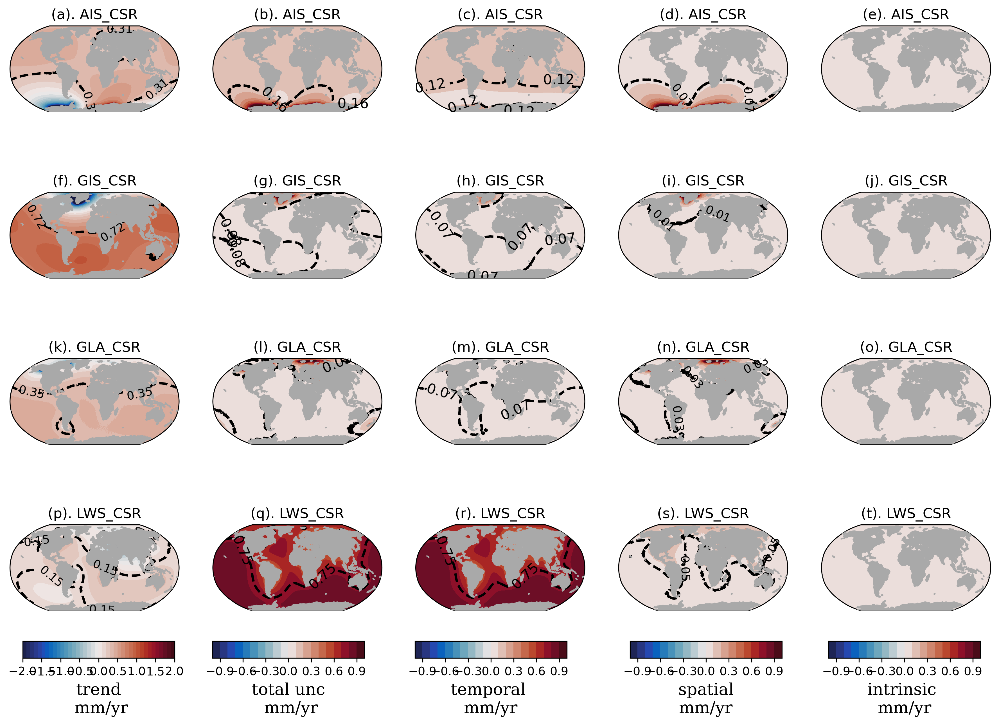

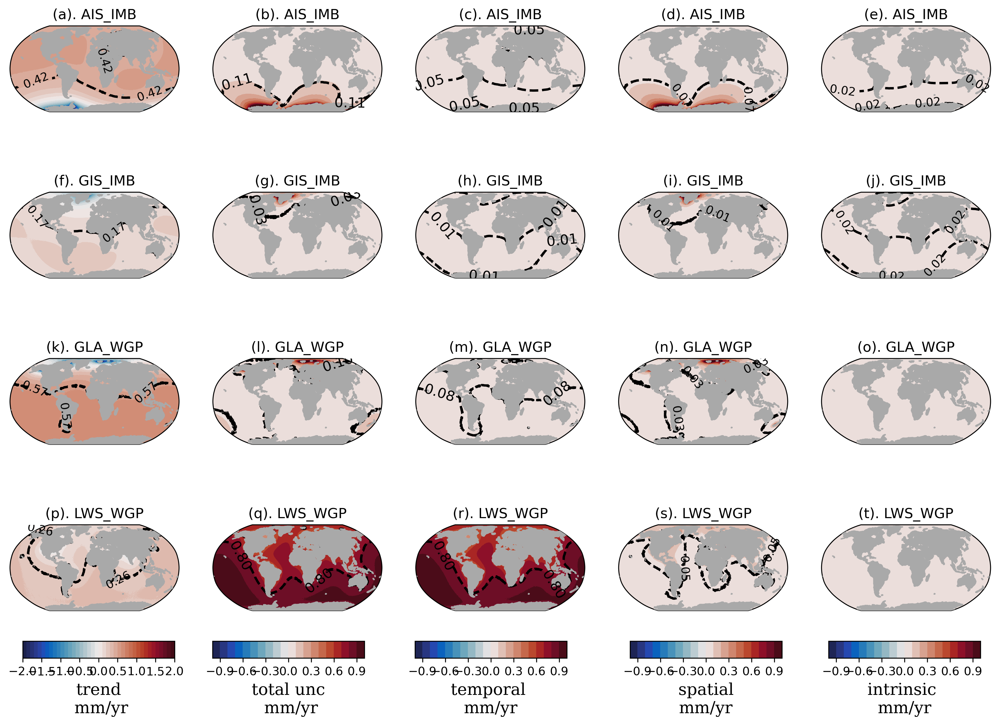

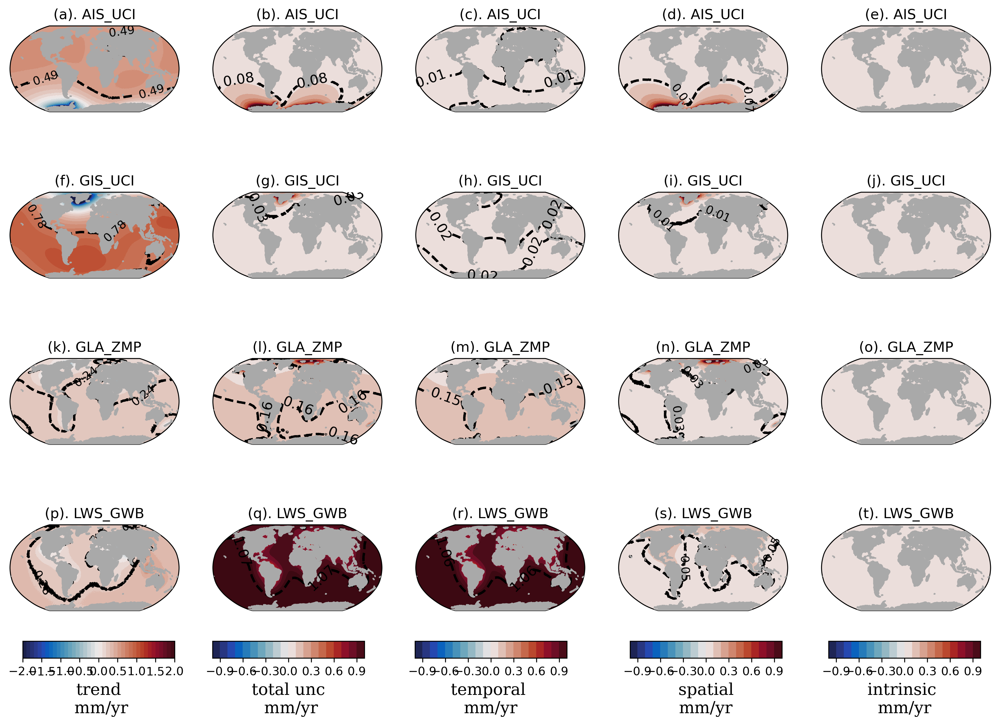

In [5]:

combos = [  ['JPL'],
          ['CSR'],
            ['IMB','WGP'],
          #['IMB','GWB','ZMP'],['UCI','WGP'],
     ['UCI','GWB','ZMP']
         ]
reconstr =[ 'JPL',
            'CSR',
              'IMB+WGP',
           #'IMB+GWB+ZMP','UCI+WGP',
     'UCI+GWB+ZMP'
          ]
i=0

panels=['trend','total unc','temporal', 'spatial', 'intrinsic']
ncol=len(panels)
ind=[0,5,10,15]
cmap=cm.cm.balance
clim=1
cmin=-clim
cmax=clim
interval=0.1
for title,combo in zip(reconstr,combos):
    j=0
    #% %
    fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    nrow=len(names)

    for iname, name in enumerate(names):
        


        trend = np.array(ds.trend.sel(name=name))
        uncs   = np.array(ds.uncs.sel(name=name))
        unc_total = np.array(ds.unc_total.sel(name=name))

        i=0;panel=panels[i]
        data=np.array(trend)
        cmap=cm.cm.balance
        cmin=-2
        cmax=2
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)
            
        cp1=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(unc_total)
        cmap=cm.cm.balance
        cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csfu=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
        cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf2=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
 #       cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)
        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf3=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)
        cp3=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  


        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
#        cmin=-0.1;cmax=0.1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)
        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf4=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp4=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  
        
        j=j+1

    if iname==len(names)-1:
        cbar_ax1 = fig.add_axes([0.135, 0.10, 0.12, 0.02])
        cbar=fig.colorbar(csf, cax=cbar_ax1,orientation='horizontal')
        # cbar.set_label(label='NM',size=14, family='serif')
        cbar.set_label(label='trend\n mm/yr',size=14, family='serif')   

        cbar_axu = fig.add_axes([0.285, 0.10, 0.12, 0.02])
        cbar=fig.colorbar(csfu, cax=cbar_axu,orientation='horizontal')
        # cbar.set_label(label='NM',size=14, family='serif')
        cbar.set_label(label='total unc\n mm/yr',size=14, family='serif')   

        # # fig.subplots_adjust(right=0.8)
        cbar_ax2 = fig.add_axes([0.445, 0.10, 0.12, 0.02])
        cbar2=plt.colorbar(csf2, cax=cbar_ax2,orientation='horizontal')
        cbar2.set_label(label='temporal \nmm/yr',size=14, family='serif')   

        cbar_ax3 = fig.add_axes([0.615, 0.10, 0.12, 0.02])
        cbar3=plt.colorbar(csf3, cax=cbar_ax3,orientation='horizontal')
        cbar3.set_label(label=' spatial \nmm/yr',size=14, family='serif')   

        cbar_ax4 = fig.add_axes([0.772, 0.10, 0.12, 0.02])
        cbar4=plt.colorbar(csf4, cax=cbar_ax4,orientation='horizontal')
        cbar4.set_label(label='intrinsic \nmm/yr',size=14, family='serif')   


    plt.show()

fig.savefig(path_to_figures+'unc_breakdown_{}-{}.png'.format(t0,t1),
             format='png',dpi=300,bbox_inches='tight')



## 1993-2017

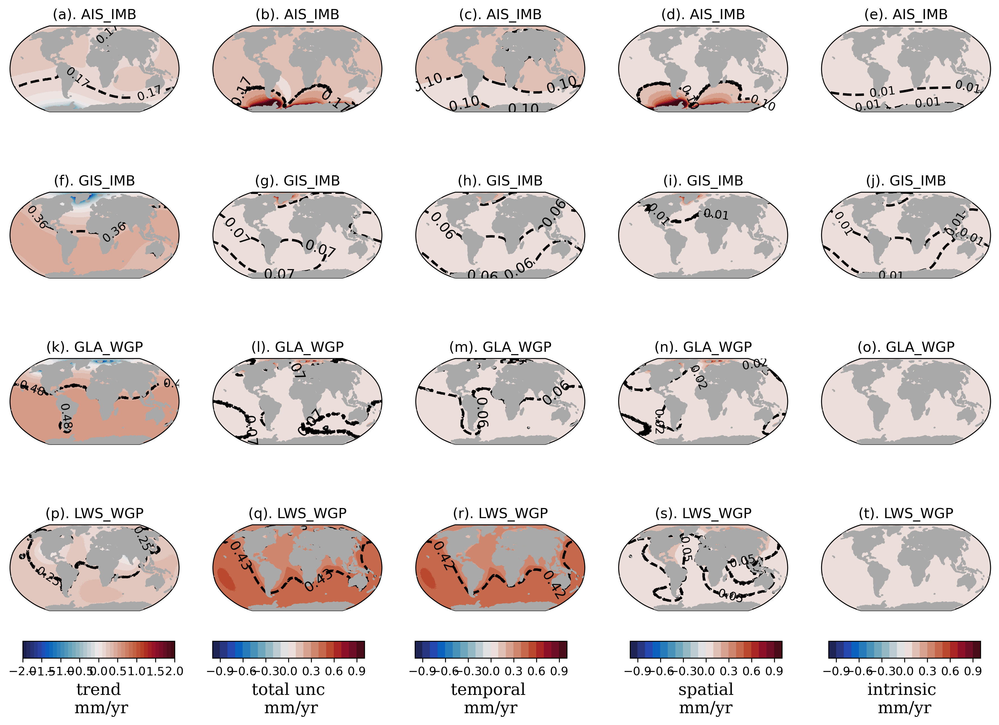

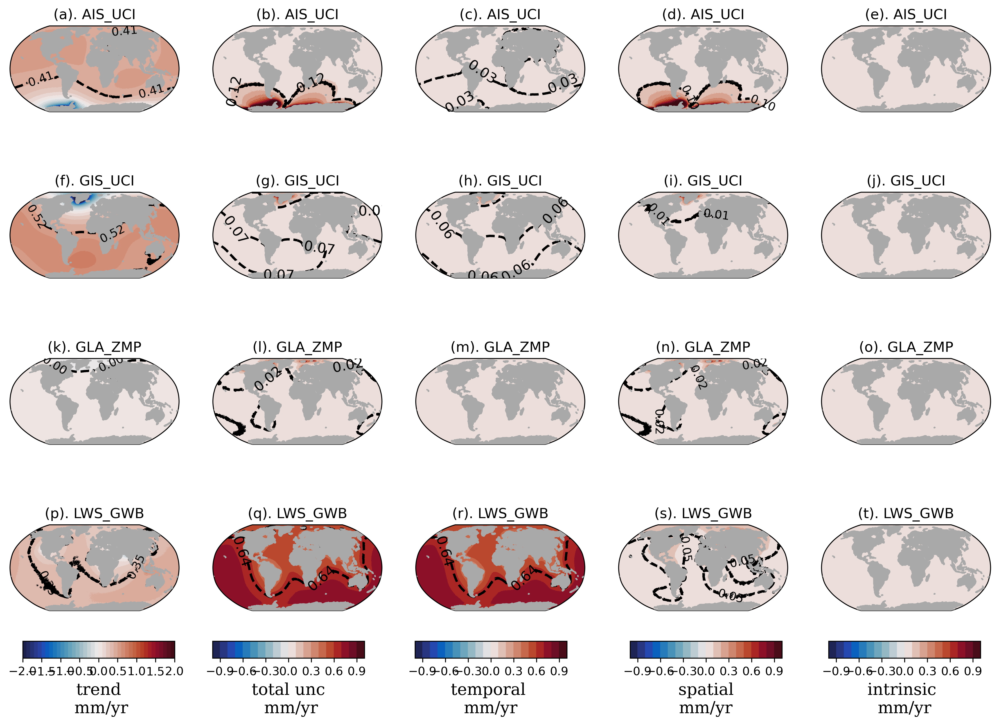

In [6]:

combos = [  # ['JPL'],
          #['CSR'],
            ['IMB','WGP'],
          #['IMB','GWB','ZMP'],['UCI','WGP'],
     ['UCI','GWB','ZMP']
         ]
reconstr =[# 'JPL',
            #'CSR',
              'IMB+WGP',
           #'IMB+GWB+ZMP','UCI+WGP',
     'UCI+GWB+ZMP'
          ]
i=0

panels=['trend','total unc','temporal', 'spatial', 'intrinsic']
ncol=len(panels)
ind=[0,5,10,15]
cmap=cm.cm.balance
clim=1
cmin=-clim
cmax=clim
interval=0.1
for title,combo in zip(reconstr,combos):
    j=0
    #% %
    fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    nrow=len(names)

    for iname, name in enumerate(names):
        


        trend = np.array(ds_a.trend.sel(name=name))
        uncs   = np.array(ds_a.uncs.sel(name=name))
        unc_total = np.array(ds_a.unc_total.sel(name=name))

        i=0;panel=panels[i]
        data=np.array(trend)
        cmap=cm.cm.balance
        cmin=-2
        cmax=2
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)
            
        cp1=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(unc_total)
        cmap=cm.cm.balance
        cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csfu=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
        cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf2=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  

        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
 #       cmin=-1;cmax=1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)
        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf3=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)
        cp3=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  


        i=i+1;panel=panels[i];j=j+1
        data=np.array(uncs[i-2,:,:])
        cmap=cm.cm.balance
#        cmin=-0.1;cmax=0.1
        ax1 = plt.subplot(nrow,ncol,i+ind[iname]+1, projection=ccrs.Robinson())
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                         zorder=3)
        ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
        mu,glb,mask=om.reg_to_glb(data,Y,X)
        glb=np.round(glb,3)

        cs=ax1.contour(X,Y,data,levels=[glb],
                # vmin=-0.6,
                # vmax=0.6,
            transform = ccrs.PlateCarree(),
            #cmap='coolwarm',#extend='both'
            colors=('black',),linestyles=('--',),linewidths=(2,)
            )
        ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=10)
        # make it discrete
        lv=np.arange(cmin,cmax+interval,interval)
        csf4=plt.contourf(X,Y,data,levels=lv,
                  transform = ccrs.PlateCarree(),cmap=cmap)

        cp4=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        ax1.set_title('({}). '.format(letters[j])+str(name))  
        
        j=j+1

    if iname==len(names)-1:
        cbar_ax1 = fig.add_axes([0.135, 0.10, 0.12, 0.02])
        cbar=fig.colorbar(csf, cax=cbar_ax1,orientation='horizontal')
        # cbar.set_label(label='NM',size=14, family='serif')
        cbar.set_label(label='trend\n mm/yr',size=14, family='serif')   

        cbar_axu = fig.add_axes([0.285, 0.10, 0.12, 0.02])
        cbar=fig.colorbar(csfu, cax=cbar_axu,orientation='horizontal')
        # cbar.set_label(label='NM',size=14, family='serif')
        cbar.set_label(label='total unc\n mm/yr',size=14, family='serif')   

        # # fig.subplots_adjust(right=0.8)
        cbar_ax2 = fig.add_axes([0.445, 0.10, 0.12, 0.02])
        cbar2=plt.colorbar(csf2, cax=cbar_ax2,orientation='horizontal')
        cbar2.set_label(label='temporal \nmm/yr',size=14, family='serif')   

        cbar_ax3 = fig.add_axes([0.615, 0.10, 0.12, 0.02])
        cbar3=plt.colorbar(csf3, cax=cbar_ax3,orientation='horizontal')
        cbar3.set_label(label=' spatial \nmm/yr',size=14, family='serif')   

        cbar_ax4 = fig.add_axes([0.772, 0.10, 0.12, 0.02])
        cbar4=plt.colorbar(csf4, cax=cbar_ax4,orientation='horizontal')
        cbar4.set_label(label='intrinsic \nmm/yr',size=14, family='serif')   


    plt.show()

fig.savefig(path_to_figures+'unc_breakdown_{}-{}.png'.format(t0_a,t1_a),
             format='png',dpi=300,bbox_inches='tight')



# Total Barystatic Uncertainty - All combinations
## 2003-2016

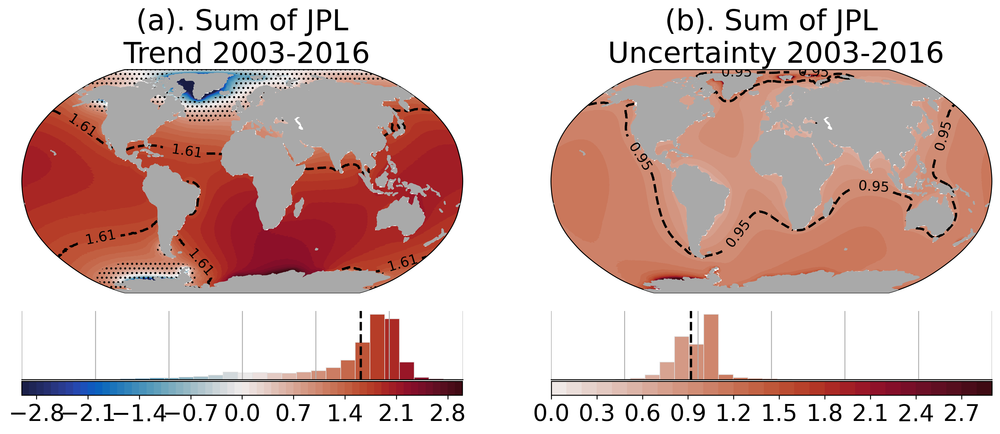

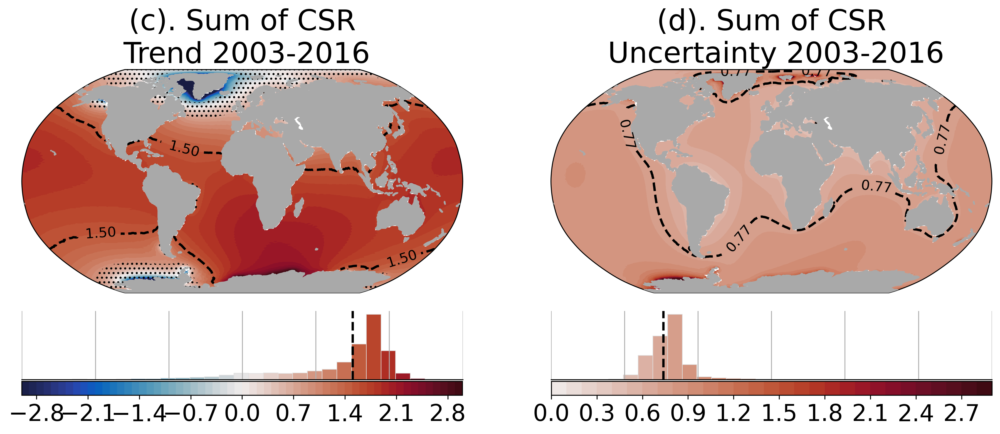

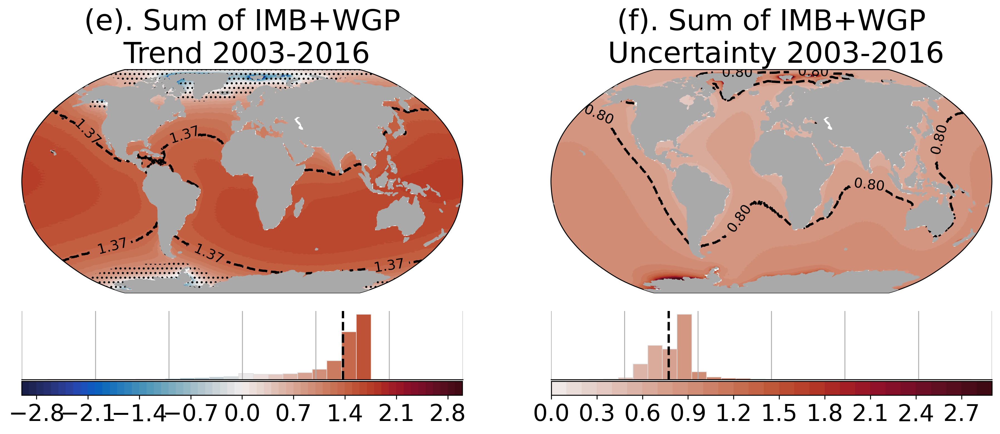

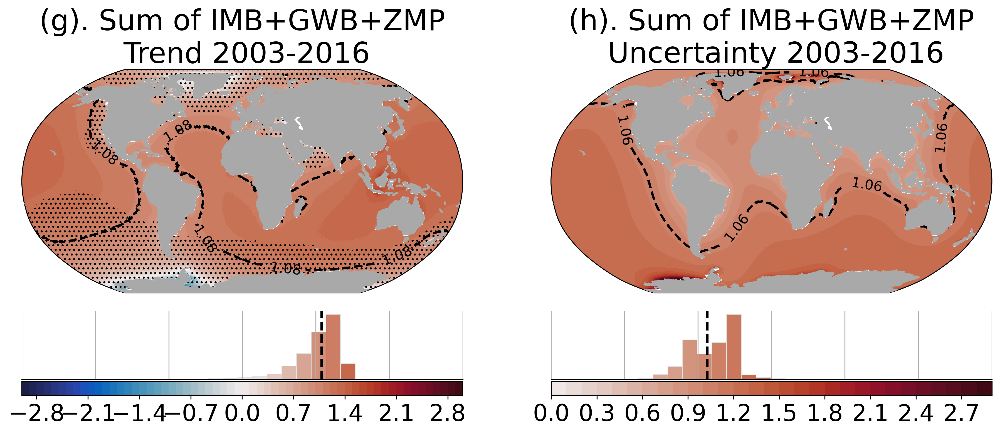

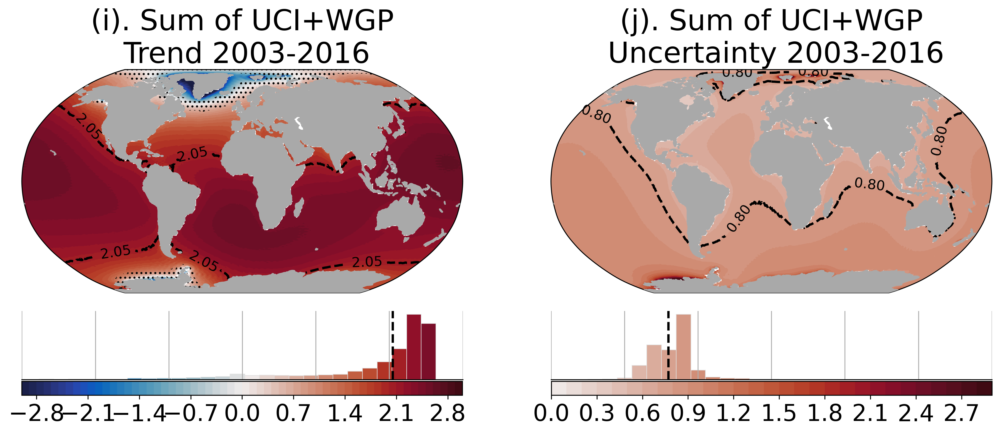

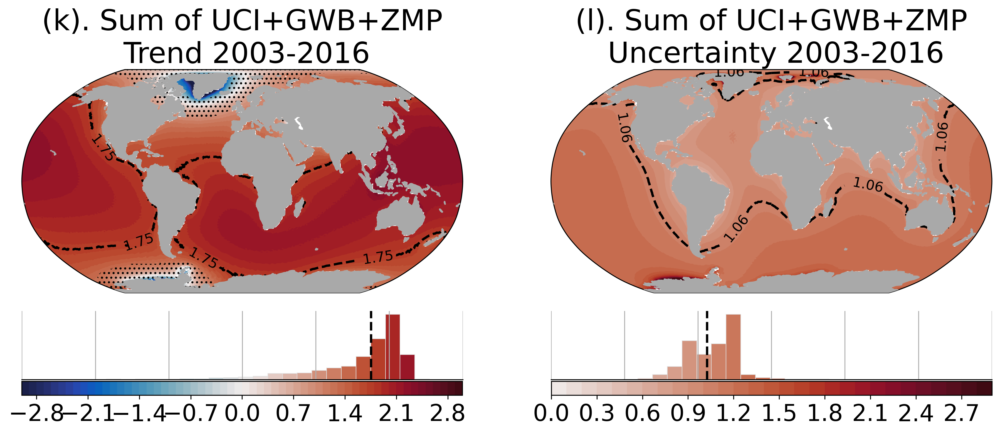

In [7]:

combos = [['JPL'],
          ['CSR'],
          ['IMB','WGP'],
          ['IMB','GWB','ZMP'],['UCI','WGP'],['UCI','GWB','ZMP']
         ]
reconstr =['JPL',
            'CSR',
           'IMB+WGP',
           'IMB+GWB+ZMP','UCI+WGP','UCI+GWB+ZMP'
          ]
i=0
j=0
cmax_unc = 3
c0=0
interval=0.1
for title,combo in zip(reconstr,combos):
    
    #% %
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    trend=np.nansum(np.array(ds.trend.sel(name=names)),axis=0)
    unc=om.quadrsum(np.array(ds.unc_total.sel(name=names)))
    grid_area=om.get_grid_area(np.zeros((trend.shape)))
    
    area=np.hstack(grid_area)
    
    alpha=1

    clim=3
    bw=0.1 # bin width
    cmap=cm.cm.balance
    cmin=-clim
    cmax=clim
    fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

    Z=np.array(trend) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    
    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(cmin,cmax+interval,interval)
    csf0=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    
    cp0=plt.pcolormesh(X,Y,Z,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    #ax1.set_title(str(name),size=fontsize)    
    
    # stipple areas where trend is smaller then unc
    Z_insg = np.array(Z)
    Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
    Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0
    
    stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                    colors='none', hatches=[None,'...'], 
                    transform = ccrs.PlateCarree(),zorder=10)
    
    ax2 = plt.subplot2grid((4,2), (3, 0))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(cmin,cmax)
    
    for bin,patch in zip(bins,patches):
        color=cmap(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(cmin,cmax)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    # UNC
    cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

    Z=np.array(unc) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
    j=j+1
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(c0,cmax_unc,0.1)
    csf=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmapnew)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,Z,
                vmin=c0,vmax=cmax_unc,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmapnew)
    #ax1.set_title(str(name),size=fontsize)    
    
    ax2 = plt.subplot2grid((4,2), (3, 1))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(c0,cmax_unc)
    
    for bin,patch in zip(bins,patches):
        color=cmapnew(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(c0,cmax_unc)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    
    cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 

    cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 
    
    plt.show()

    
    i=i+1
    j=j+1

    
    fig.savefig(path_to_figures+'total_barystatic_{}-{}_{}.png'.format(t0,t1,title),
                format='png',dpi=300,bbox_inches='tight')



## 1993-2017

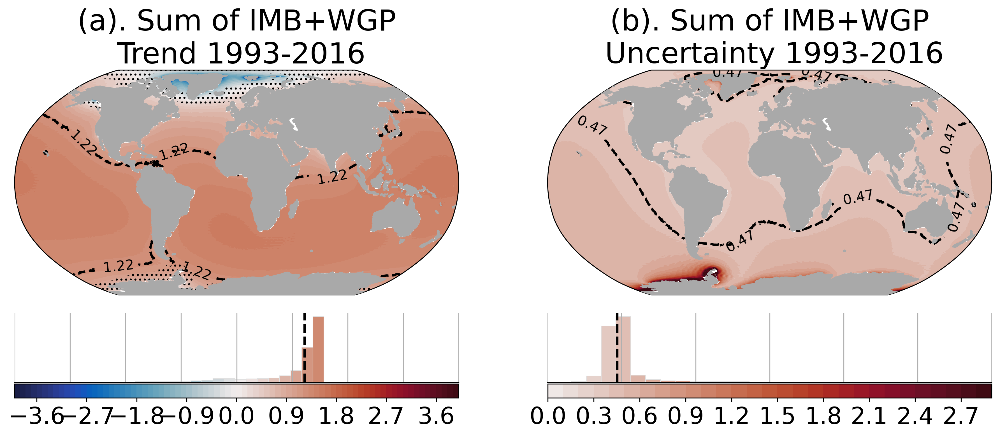

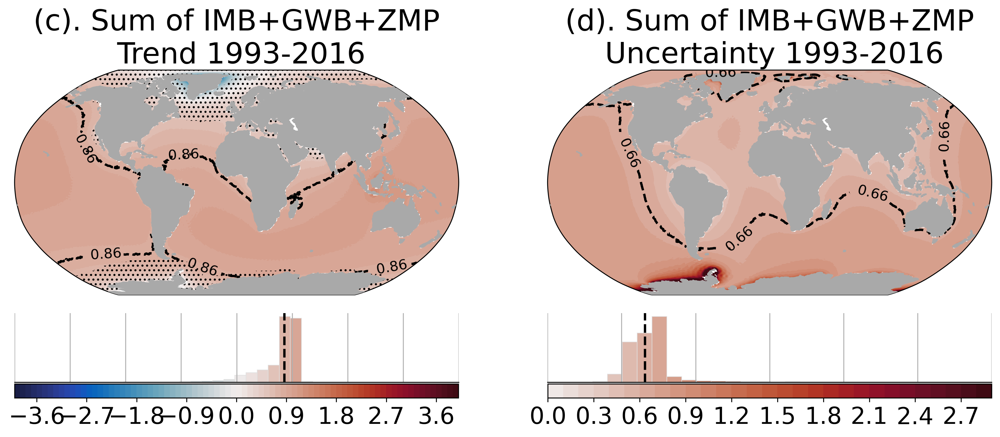

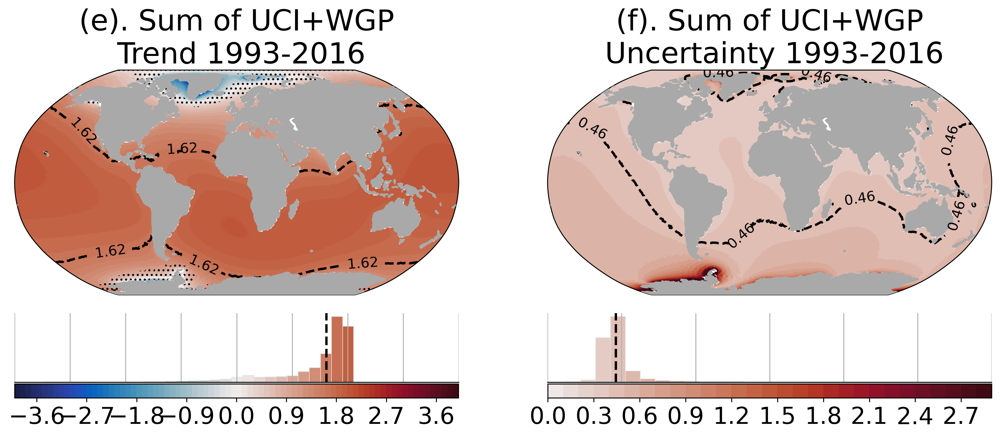

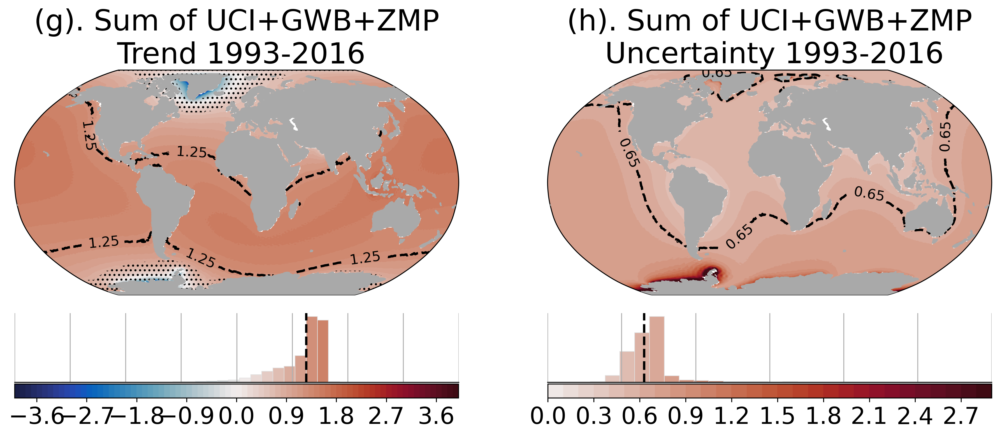

In [8]:

combos = [# ['JPL'],
          #  ['CSR'],
          ['IMB','WGP'],
          ['IMB','GWB','ZMP'],['UCI','WGP'],
        ['UCI','GWB','ZMP']
         ]
reconstr =[#'JPL',
            #'CSR',
           'IMB+WGP',
           'IMB+GWB+ZMP','UCI+WGP',
    'UCI+GWB+ZMP'
          ]
i=0
j=0
cmax_unc = 3
c0=0
interval=0.1
for title,combo in zip(reconstr,combos):
    
    #% %
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    trend=np.nansum(np.array(ds_a.trend.sel(name=names)),axis=0)
    unc=om.quadrsum(np.array(ds_a.unc_total.sel(name=names)))
    grid_area=om.get_grid_area(np.zeros((trend.shape)))
    
    area=np.hstack(grid_area)
    
    alpha=1

    clim=4
    bw=0.1 # bin width
    cmap=cm.cm.balance
    cmin=-clim
    cmax=clim
    fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

    Z=np.array(trend) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0_a,t1_a),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    
    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(cmin,cmax+interval,interval)
    csf0=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    
    cp0=plt.pcolormesh(X,Y,Z,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    #ax1.set_title(str(name),size=fontsize)    
    
    # stipple areas where trend is smaller then unc
    Z_insg = np.array(Z)
    Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
    Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0
    
    stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                    colors='none', hatches=[None,'...'], 
                    transform = ccrs.PlateCarree(),zorder=10)
    
    ax2 = plt.subplot2grid((4,2), (3, 0))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(cmin,cmax)
    
    for bin,patch in zip(bins,patches):
        color=cmap(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(cmin,cmax)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    # UNC
    cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

    Z=np.array(unc) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
    j=j+1
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0_a,t1_a),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(c0,cmax_unc,0.1)
    csf=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmapnew)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,Z,
                vmin=c0,vmax=cmax_unc,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmapnew)
    #ax1.set_title(str(name),size=fontsize)    
    
    ax2 = plt.subplot2grid((4,2), (3, 1))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(c0,cmax_unc)
    
    for bin,patch in zip(bins,patches):
        color=cmapnew(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(c0,cmax_unc)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    
    cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 

    cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 
    
    plt.show()

    
    i=i+1
    j=j+1

    
    fig.savefig(path_to_figures+'SI-total_barystatic_{}-{}_{}.png'.format(t0_a,t1_a,title),
                format='png',dpi=300,bbox_inches='tight')



# Coastal Examples - All Combinations

## 2003-2016

In [9]:
reconstr =['JPL',
            'CSR',
           'IMB+WGP',
           'IMB+GWB+ZMP',
           'UCI+WGP',
            'UCI+GWB+ZMP'
          ]
for name in reconstr:
    name = name+'_unc'
    df= pd.read_pickle(path+'coastal_examples_10-{}-{}.p'.format(t0,t1))
    df['label'] = ['Cape Town \n(ZA)','Jakarta \n(ID)', 'Lima \n(PE)', 'Mogadishu \n(SO)', 'Rio de Janeiro \n(BR)',
                  'Rotterdam \n(NL)', 'Sydney \n(AU)', 'Tokyo \n(JP)', 'Vancouver \n(CA)', 'Washington \n(US)']
    df['lon2']=om.from_360_to_180(df['lon'])
    # df=df.sort_values(by=['lat','lon2'],ascending=[False,True]).reset_index()
    df= df.sort_values(by=['lon2','lat'],ascending=[True,False]).reset_index()
    df=df.drop('index',axis=1)

    df_global=pd.read_pickle(path+'OM_reconstructions_OLS-{}-{}.p'.format(t0,t1))



    df_sel=pd.DataFrame({'{}_AIS'.format(name):np.array(df['{}_AIS'.format(name)]),
                         '{}_GIS'.format(name):np.array(df['{}_GIS'.format(name)]),
                         '{}_GLA'.format(name):np.array(df['{}_GLA'.format(name)]),
                         '{}_LWS'.format(name):np.array(df['{}_LWS'.format(name)]),

                         }
                        )
    total_unc = np.array(df['{}_tot'.format(name)])
    name_trend = name.split('_')[0]+'_trend_tot'

    lon=np.array(df_global['lon']).reshape(180,360)[0,:]
    lon[-1]=360
    lat=np.array(df_global['lat']).reshape(180,360)[:,0]


    dataset=name.split('_')[0]
    if '+' in dataset:
        if len(dataset.split('+'))==2:
            dataset0=dataset.split('+')[0]
            dataset1=dataset.split('+')[1]
            names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                                         name.split('_')[1]==dataset1]
        elif len(dataset.split('+'))==3:
            dataset0=dataset.split('+')[0]
            dataset1=dataset.split('+')[1]
            dataset2=dataset.split('+')[2]

            names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                                         name.split('_')[1]==dataset1 or 
                                                          name.split('_')[1]==dataset2]
    else:
        names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset]
    

    da=ds.sel(name=names)
    locations = df[['lon','lat']]
    llon,llat=np.meshgrid(np.array(ds.lon),np.array(-ds.lat))
    # AIS
    i=0
    df_AIS = pd.DataFrame({ '{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_AIS['lon']=llon.flatten()
    df_AIS['lat']=llat.flatten()
    df_AIS=pd.merge(locations,df_AIS,on=['lon','lat'])
    df_AIS=df_AIS.drop(['lat','lon'],axis=1)

    i=i+1
    df_GIS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_GIS['lon']=llon.flatten()
    df_GIS['lat']=llat.flatten()
    df_GIS=pd.merge(locations,df_GIS,on=['lon','lat'])
    df_GIS=df_GIS.drop(['lat','lon'],axis=1)
    i=i+1
    df_GLA = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_GLA['lon']=llon.flatten()
    df_GLA['lat']=llat.flatten()
    df_GLA=pd.merge(locations,df_GLA,on=['lon','lat'])
    df_GLA=df_GLA.drop(['lat','lon'],axis=1)
    i=i+1
    df_LWS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_LWS['lon']=llon.flatten()
    df_LWS['lat']=llat.flatten()
    df_LWS=pd.merge(locations,df_LWS,on=['lon','lat'])
    df_LWS=df_LWS.drop(['lat','lon'],axis=1)

    unc_typ=['temporal',
             'intrinsic','spatial']
    X2=np.zeros((len(unc_typ),len(df)))
    for i,unc in enumerate(unc_typ):
        X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
    X_rel=om.get_percentage_quadra(X2)
    X_rel2=om.get_percentage(X2)

    df_sel2=pd.DataFrame(X_rel.T,columns=unc_typ)
    df_sel3=pd.DataFrame(X_rel2.T,columns=unc_typ)
    df_sel3= df_sel3[df_AIS.columns.tolist()]


    regions=['AIS','GIS','GLA','LWS']
    X2=np.zeros((len(regions),len(df)))
    for i,unc in enumerate(regions):
        X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
    X_rel=om.get_percentage_quadra(X2)
    X_rel2=om.get_percentage(X2)

    df_sel2b=pd.DataFrame(X_rel.T,columns=regions)
    df_sel3b=pd.DataFrame(X_rel2.T,columns=regions)

    dpi=300
    fsize=(15,10)
    cmin=0
    cmax=3
    max_ratio = 0.75
    ratio = total_unc*max_ratio/np.nanmax(total_unc)

    fig = plt.figure(dpi=dpi,figsize=fsize)
    proj=ccrs.PlateCarree()
    proj=ccrs.Robinson()

    ax = plt.subplot(211,projection=proj)
    plt.title('{}, {}-{}'.format(name.split('_')[0],t0,t1),fontsize=fontsize+2)
    ax.coastlines(resolution='110m')
    ax.set_global()
    ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                        zorder=3)
    splot = plt.pcolormesh(lon,lat,
                       np.array(df_global[name+'_tot']).reshape(180,360),
                       transform=ccrs.PlateCarree(),
                       cmap=cmapnew,
                       vmin=cmin,vmax=cmax)
    # plt.savefig('map.png')
    #splot = plt.pcolormesh(lon,lat,
     #                  np.array(df_global[name_trend]).reshape(180,360),
      #                 transform=ccrs.PlateCarree(),
       #                cmap=cm.cm.balance,
        #               vmin=-5,vmax=5)

    ax.text(-145, 68, 
                '(a)', 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), 
            # fontweight='bold',
           fontsize=fontsize-5)
    #% %
    # plt.colorbar(splot,orientation='vertical')
    #cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
    #cbar = plt.colorbar(splot, cax=cax)
    #cbar.set_label(label='Trend (mm/yr)',fontsize=fontsize-5)

    zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
    for (lg, lt, ne, r) in zip_object:
        lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
        p=om.plot_pie_inset(df_sel3b.iloc[ne-1],lonr,latr,ax,r,
                         colors=['red','black','white','lightblue'])
        if ne==4 or ne==5:
            y_offset =12
        elif ne==6:
            y_offset = 16
        else:
            y_offset=15
        ax.text(lg - .05, lt + y_offset, 
                ne, 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
        if ne==2:
            labels=['AIS','GIS','GLA','LWS']
            patches, texts = plt.pie(df_sel3b.iloc[ne-1],colors=['red','black','white','lightblue'], 
                                     counterclock=False,
                                     startangle=90
                                     )
            plt.legend(patches, labels,  bbox_to_anchor=( -1,1.5))
    # plt.show()

    # fig = plt.figure(dpi=dpi,figsize=fsize)
    ax = plt.subplot(212,projection=proj)
    ax.coastlines(resolution='110m')
    ax.set_global()
    ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                        zorder=3)
    # plt.savefig('map.png')
    splot = plt.pcolormesh(lon,lat,
                       np.array(df_global[name+'_tot']).reshape(180,360),
                       transform=ccrs.PlateCarree(),
                       cmap=cmapnew,
                       vmin=cmin,vmax=cmax)


    #% %
    # plt.colorbar(splot,orientation='vertical')
    cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height*2+0.05])
    cbar = plt.colorbar(splot, cax=cax)
    cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
    ax.text(-145, 68, 
                '(b)', 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), 
            # fontweight='bold',
           fontsize=fontsize-5)
    # for b in range(len(df)):
        # lonr=xlon[b];latr=ylat[b]
       # lonr,latr =  proj.transform_point(df['lon'][b],df['lat'][b], ccrs.PlateCarree())
       # p=om.plot_pie_inset(df_sel.iloc[b],lonr,latr,ax,0.4)
        # om.plot_pie_inset(df_sel2.iloc[0][['JPL_unc_intrinsic','JPL_unc_spatial']],lonr,latr,ax,0.2)
        # df_sel2.iloc[0][['JPL_unc_temporal','JPL_unc_spatial']]

    zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
    for (lg, lt, ne, r) in zip_object:
        lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
        p=om.plot_pie_inset(df_sel3.iloc[ne-1],lonr,latr,ax,r)
        if ne==4 or ne==5:
            y_offset =12
        elif ne==6:
            y_offset = 16
        else:
            y_offset=15
        ax.text(lg-.05, lt + y_offset, 
                ne, 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
        if ne==2:
            labels=['temporal','spatial','intrinsic']
            patches, texts = plt.pie(df_sel3.iloc[ne-1],colors=['seagreen','purple','cyan'],
                                    counterclock=False,
                                     startangle=90)
            plt.legend(patches, labels,  bbox_to_anchor=( -0.4,1))
    plt.show()

    fig.savefig(path_to_figures+'coastal_examples_maps_{}-{}-{}.png'.format(name,t0,t1),
                format='png',dpi=300,bbox_inches='tight')

    #% % plot clustered
    xlabel=['{}.{}'.format(i+1,label) for i,label in enumerate(np.array(df['label']))]

    fig =om. plot_clustered_stacked([df_AIS,df_GIS,df_GLA,df_LWS],
                           labels=['AIS','GIS','GLA','LWS'],xlabel=xlabel,
                                 xoffset=-0.12,
                           dpi=dpi,fsize=(16,5),title='(c).Uncertainty Breakdown',
                           color=['seagreen','purple','cyan'],
                           ylabel='Uncertainty (mm/yr)')

    plt.show()

    fig.savefig(path_to_figures+'coastal_examples_bars_{}-{}-{}.png'.format(name,t0,t1),
                 format='png',dpi=300,bbox_inches='tight')

FileNotFoundError: [Errno 2] No such file or directory: '../data/output/OM_reconstructions_OLS-2003-2016.p'

## 1993-2017

In [ ]:
reconstr =[#'JPL',
            # 'CSR',
           'IMB+WGP',
           'IMB+GWB+ZMP',
           'UCI+WGP',
            'UCI+GWB+ZMP'
          ]
for name in reconstr:
    name = name+'_unc'
    df= pd.read_pickle(path+'coastal_examples_10-{}-{}.p'.format(t0_a,t1_a))
    df['label'] = ['Cape Town \n(ZA)','Jakarta \n(ID)', 'Lima \n(PE)', 'Mogadishu \n(SO)', 'Rio de Janeiro \n(BR)',
                  'Rotterdam \n(NL)', 'Sydney \n(AU)', 'Tokyo \n(JP)', 'Vancouver \n(CA)', 'Washington \n(US)']
    df['lon2']=om.from_360_to_180(df['lon'])
    # df=df.sort_values(by=['lat','lon2'],ascending=[False,True]).reset_index()
    df= df.sort_values(by=['lon2','lat'],ascending=[True,False]).reset_index()
    df=df.drop('index',axis=1)

    df_global=pd.read_pickle(path+'OM_reconstructions_OLS-{}-{}.p'.format(t0_a,t1_a))



    df_sel=pd.DataFrame({'{}_AIS'.format(name):np.array(df['{}_AIS'.format(name)]),
                         '{}_GIS'.format(name):np.array(df['{}_GIS'.format(name)]),
                         '{}_GLA'.format(name):np.array(df['{}_GLA'.format(name)]),
                         '{}_LWS'.format(name):np.array(df['{}_LWS'.format(name)]),

                         }
                        )
    total_unc = np.array(df['{}_tot'.format(name)])
    name_trend = name.split('_')[0]+'_trend_tot'

    lon=np.array(df_global['lon']).reshape(180,360)[0,:]
    lon[-1]=360
    lat=np.array(df_global['lat']).reshape(180,360)[:,0]


    dataset=name.split('_')[0]
    if '+' in dataset:
        if len(dataset.split('+'))==2:
            dataset0=dataset.split('+')[0]
            dataset1=dataset.split('+')[1]
            names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                                         name.split('_')[1]==dataset1]
        elif len(dataset.split('+'))==3:
            dataset0=dataset.split('+')[0]
            dataset1=dataset.split('+')[1]
            dataset2=dataset.split('+')[2]

            names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                                         name.split('_')[1]==dataset1 or 
                                                          name.split('_')[1]==dataset2]
    else:
        names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset]

    da=ds.sel(name=names)
    locations = df[['lon','lat']]
    llon,llat=np.meshgrid(np.array(ds.lon),np.array(-ds.lat))
    # AIS
    i=0
    df_AIS = pd.DataFrame({ '{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_AIS['lon']=llon.flatten()
    df_AIS['lat']=llat.flatten()
    df_AIS=pd.merge(locations,df_AIS,on=['lon','lat'])
    df_AIS=df_AIS.drop(['lat','lon'],axis=1)

    i=i+1
    df_GIS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_GIS['lon']=llon.flatten()
    df_GIS['lat']=llat.flatten()
    df_GIS=pd.merge(locations,df_GIS,on=['lon','lat'])
    df_GIS=df_GIS.drop(['lat','lon'],axis=1)
    i=i+1
    df_GLA = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_GLA['lon']=llon.flatten()
    df_GLA['lat']=llat.flatten()
    df_GLA=pd.merge(locations,df_GLA,on=['lon','lat'])
    df_GLA=df_GLA.drop(['lat','lon'],axis=1)
    i=i+1
    df_LWS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
    df_LWS['lon']=llon.flatten()
    df_LWS['lat']=llat.flatten()
    df_LWS=pd.merge(locations,df_LWS,on=['lon','lat'])
    df_LWS=df_LWS.drop(['lat','lon'],axis=1)

    unc_typ=['temporal',
             'intrinsic','spatial']
    X2=np.zeros((len(unc_typ),len(df)))
    for i,unc in enumerate(unc_typ):
        X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
    X_rel=om.get_percentage_quadra(X2)
    X_rel2=om.get_percentage(X2)

    df_sel2=pd.DataFrame(X_rel.T,columns=unc_typ)
    df_sel3=pd.DataFrame(X_rel2.T,columns=unc_typ)
    df_sel3= df_sel3[df_AIS.columns.tolist()]


    regions=['AIS','GIS','GLA','LWS']
    X2=np.zeros((len(regions),len(df)))
    for i,unc in enumerate(regions):
        X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
    X_rel=om.get_percentage_quadra(X2)
    X_rel2=om.get_percentage(X2)

    df_sel2b=pd.DataFrame(X_rel.T,columns=regions)
    df_sel3b=pd.DataFrame(X_rel2.T,columns=regions)

    dpi=300
    fsize=(15,10)
    cmin=0
    cmax=3
    max_ratio = 0.75
    ratio = total_unc*max_ratio/np.nanmax(total_unc)

    fig = plt.figure(dpi=dpi,figsize=fsize)
    proj=ccrs.PlateCarree()
    proj=ccrs.Robinson()

    ax = plt.subplot(211,projection=proj)
    plt.title('{}, {}-{}'.format(name.split('_')[0],t0_a,t1_a),fontsize=fontsize+2)
    ax.coastlines(resolution='110m')
    ax.set_global()
    ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                        zorder=3)
    splot = plt.pcolormesh(lon,lat,
                       np.array(df_global[name+'_tot']).reshape(180,360),
                       transform=ccrs.PlateCarree(),
                       cmap=cmapnew,
                       vmin=cmin,vmax=cmax)
    # plt.savefig('map.png')
    #splot = plt.pcolormesh(lon,lat,
     #                  np.array(df_global[name_trend]).reshape(180,360),
      #                 transform=ccrs.PlateCarree(),
       #                cmap=cm.cm.balance,
        #               vmin=-5,vmax=5)

    ax.text(-145, 68, 
                '(a)', 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), 
            # fontweight='bold',
           fontsize=fontsize-5)
    #% %
    # plt.colorbar(splot,orientation='vertical')
    #cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
    #cbar = plt.colorbar(splot, cax=cax)
    #cbar.set_label(label='Trend (mm/yr)',fontsize=fontsize-5)

    zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
    for (lg, lt, ne, r) in zip_object:
        lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
        p=om.plot_pie_inset(df_sel3b.iloc[ne-1],lonr,latr,ax,r,
                         colors=['red','black','white','lightblue'])
        if ne==4 or ne==5:
            y_offset =12
        elif ne==6:
            y_offset = 16
        else:
            y_offset=15
        ax.text(lg - .05, lt + y_offset, 
                ne, 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
        if ne==2:
            labels=['AIS','GIS','GLA','LWS']
            patches, texts = plt.pie(df_sel3b.iloc[ne-1],colors=['red','black','white','lightblue'], 
                                     counterclock=False,
                                     startangle=90
                                     )
            plt.legend(patches, labels,  bbox_to_anchor=( -1,1.5))
    # plt.show()

    # fig = plt.figure(dpi=dpi,figsize=fsize)
    ax = plt.subplot(212,projection=proj)
    ax.coastlines(resolution='110m')
    ax.set_global()
    ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                        zorder=3)
    # plt.savefig('map.png')
    splot = plt.pcolormesh(lon,lat,
                       np.array(df_global[name+'_tot']).reshape(180,360),
                       transform=ccrs.PlateCarree(),
                       cmap=cmapnew,
                       vmin=cmin,vmax=cmax)


    #% %
    # plt.colorbar(splot,orientation='vertical')
    cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height*2+0.05])
    cbar = plt.colorbar(splot, cax=cax)
    cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
    ax.text(-145, 68, 
                '(b)', 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), 
            # fontweight='bold',
           fontsize=fontsize-5)
    # for b in range(len(df)):
        # lonr=xlon[b];latr=ylat[b]
       # lonr,latr =  proj.transform_point(df['lon'][b],df['lat'][b], ccrs.PlateCarree())
       # p=om.plot_pie_inset(df_sel.iloc[b],lonr,latr,ax,0.4)
        # om.plot_pie_inset(df_sel2.iloc[0][['JPL_unc_intrinsic','JPL_unc_spatial']],lonr,latr,ax,0.2)
        # df_sel2.iloc[0][['JPL_unc_temporal','JPL_unc_spatial']]

    zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
    for (lg, lt, ne, r) in zip_object:
        lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
        p=om.plot_pie_inset(df_sel3.iloc[ne-1],lonr,latr,ax,r)
        if ne==4 or ne==5:
            y_offset =12
        elif ne==6:
            y_offset = 16
        else:
            y_offset=15
        ax.text(lg-.05, lt + y_offset, 
                ne, 
                va='center', zorder=10,
                ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
        if ne==2:
            labels=['temporal','spatial','intrinsic']
            patches, texts = plt.pie(df_sel3.iloc[ne-1],colors=['seagreen','purple','cyan'],
                                    counterclock=False,
                                     startangle=90)
            plt.legend(patches, labels,  bbox_to_anchor=( -0.4,1))
    plt.show()

    fig.savefig(path_to_figures+'coastal_examples_maps_{}-{}-{}.png'.format(name,t0_a,t1_a),
                format='png',dpi=300,bbox_inches='tight')

    #% % plot clustered
    xlabel=['{}.{}'.format(i+1,label) for i,label in enumerate(np.array(df['label']))]

    fig =om. plot_clustered_stacked([df_AIS,df_GIS,df_GLA,df_LWS],
                           labels=['AIS','GIS','GLA','LWS'],xlabel=xlabel,
                                 xoffset=-0.12,
                           dpi=dpi,fsize=(16,5),title='(c).Uncertainty Breakdown',
                           color=['seagreen','purple','cyan'],
                           ylabel='Uncertainty (mm/yr)')

    plt.show()

    fig.savefig(path_to_figures+'coastal_examples_bars_{}-{}-{}.png'.format(name,t0_a,t1_a),
                 format='png',dpi=300,bbox_inches='tight')

# Spatial-structural uncertainty not normalized

In [ ]:
# 2003-2016

fontsize=25
ticksize=20
dpi=300
clim=1
cmap=cmap_unc
cmin=-clim;
cmin=0
cmap = cm.tools.crop(cmap, cmin,cmax,c0)


cmax=clim
dimlat=180;dimlon=360
names=[name for name in np.array(ds.name) if name.split('_')[1]=='CSR']
interval=0.1
fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
for iname, name in enumerate(names):
    da=ds.sel(name=[name])
    data = np.array(da.uncs[1,0,:,:])
    ax1 = plt.subplot(2,2,iname+1, projection=ccrs.Robinson())
    
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    lv=np.arange(cmin,cmax+interval,interval)
    csf=plt.contourf(X,Y,np.abs(data),levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    mu,glb,mask=om.reg_to_glb(data,Y,X)
    glb=np.round(glb,3)
 
    cs=ax1.contour(X,Y,data,
                   levels=[glb],
               # levels=[0.15, 0.30, 0.45, 0.6, 0.75],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )   
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,data,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.set_title('({}). '.format(letters[iname])+str(name).split('_')[0],size=fontsize)    


cbar_ax2 = fig.add_axes([0.125, 0.05, 0.8, 0.033])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Spatial-structural Uncertainty (mm/yr)\n 2003-2016',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()



In [ ]:
# 1993-2017



fontsize=25
ticksize=20
dpi=300
clim=1
cmap=cmap_unc
cmin=-clim;
cmin=0
cmap = cm.tools.crop(cmap, cmin,cmax,c0)


cmax=clim
dimlat=180;dimlon=360
names=[name for name in np.array(ds_a.name) if name.split('_')[1]=='IMB' or name.split('_')[1]=='WGP']
interval=0.1
fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
for iname, name in enumerate(names):
    da=ds_a.sel(name=[name])
    data = np.array(da.uncs[1,0,:,:])
    ax1 = plt.subplot(2,2,iname+1, projection=ccrs.Robinson())
    
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    lv=np.arange(cmin,cmax+interval,interval)
    csf=plt.contourf(X,Y,np.abs(data),levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    mu,glb,mask=om.reg_to_glb(data,Y,X)
    glb=np.round(glb,3)
 
    cs=ax1.contour(X,Y,data,
                   levels=[glb],
               # levels=[0.15, 0.30, 0.45, 0.6, 0.75],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )   
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,data,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.set_title('({}). '.format(letters[iname])+str(name).split('_')[0],size=fontsize)    


cbar_ax2 = fig.add_axes([0.125, 0.05, 0.8, 0.033])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Spatial-structural Uncertainty (mm/yr)\n 1993-2017',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()



# Intrinsic 1993-2017

In [ ]:
names = ['AIS_IMB','GIS_IMB']

#%% plot
fontsize=25
ticksize=20
dpi=300
clim=0.1
cmap='Blues'
cmin=0
cmax=clim
fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
interval=0.01

for iname,name in enumerate(names):
    da=ds_a.sel(name=name)
    # print(name)
    ax1 = plt.subplot(3,2,iname+1, projection=ccrs.Robinson())
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    da=ds.sel(name=name)

    # SLF monthly then trend:
    data=np.array(da.uncs[2,:,:])

    lv=np.arange(cmin,cmax+interval,interval)
    csf=plt.contourf(X,Y,np.abs(data),levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    mu,glb,mask=om.reg_to_glb(data,Y,X)
    glb=np.round(glb,3)
 
    cs=ax1.contour(X,Y,data,
                   levels=[glb],
               # levels=[0.15, 0.30, 0.45, 0.6, 0.75],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )   
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,data,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.set_title('({}). '.format(letters[iname])+str(name).split('_')[0],size=fontsize)    
    ax1.set_title(str(name),size=fontsize)    


cbar_ax2 = fig.add_axes([0.152, 0.6, 0.72, 0.033])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Intrinsic Uncertainty \n{}-{} (mm/yr)'.format(t0_a,t1_a),size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()



# GMSL

In [ ]:



#%% mask
mask=xr.open_dataset(path+'../LAND_MASK.CRI_360x180.nc')
# mask.land_mask.plot()
mask=mask.sortby('lat',ascending=False)
oceanmask=np.array(mask.land_mask)
oceanmask[oceanmask>0]=np.nan
oceanmask[oceanmask==0]=1
#%%


df=pd.read_pickle(path+'global-final_combos-{}-{}_v2.p'.format(t0,t1))

df_reg = pd.read_pickle(path+'OM_reconstructions_{}-{}.p'.format(t0,t1))

dimlat=180;dimlon=360
lon=np.array(df_reg['lon']).reshape(dimlat,dimlon)[0,:]
lat=np.array(df_reg['lat']).reshape(dimlat,dimlon)[:,0]

reg_trend=np.zeros((len(df['combinations'])))
# reg_trend_ols=np.full_like(reg_trend,0)
reg_unc=np.full_like(reg_trend,0)

for i,combo in enumerate(np.array(df['combinations'])):
    reg_trend[i],_,_=om.reg_to_glb(np.array(df_reg[combo+'_trend_tot']).reshape(dimlat,dimlon),lat,lon)
    reg_unc[i],_,_=om.reg_to_glb(np.array(df_reg[combo+'_unc_tot']).reshape(dimlat,dimlon),lat,lon)
    # reg_trend_ols[i],_,_=om.reg_to_glb(np.array(df_reg_ols[combo+'_trend_tot']).reshape(dimlat,dimlon),lat,lon)

df['reg_trend_nm'] = reg_trend
# df['reg_trend_ols'] = df_reg_ols['trend']
df['reg_unc'] = reg_unc


In [ ]:
col = ['trend','reg_trend_nm',
       # 'trend_OLS','reg_trend_ols',
       'total_unc','reg_unc',
       # 'temp_unc',
       ]
labels = ['GMSL trend (NM)', 'mean (regional trend)', 
          # 'gmsl trend (OLS)','mean(regional trend(OLS))', 
          'GMSL uncertainty','mean (regional uncertainty)' ,
           ]
color = {1:'black', 
         2:'red', 
         3:'orange', 
         4:'green'
        }
fig=plt.figure(figsize=(10,5),dpi=100,facecolor='w')

syb=['s','s',
     # 'd','d',
     "^",'^','v','*','D','X','X','X']
ax=plt.subplot(111)
for i,c in enumerate(col):
    df.plot.scatter(x='combinations',y=c,ax=ax,
                    marker=syb[i],
                    s=80,
#                     color=col_dict[i+1],
                    color=color[i+1],
                    label=labels[i])
plt.legend(loc='upper left',ncol=int(len(labels)/2),fontsize=12)
plt.ylim([0,2.5])
plt.xticks(np.arange(0,len(df['combinations'])),
           df['combinations'],
           rotation=75,fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('mm/year',fontsize=12)
plt.xlabel('combinations',fontsize=12)
plt.grid()
plt.show()
#%%
path_to_figures = '/Users/ccamargo/Documents/PhD/Barystatic/manuscript/latex/figures_v3/overleaf/'
fig.savefig(path_to_figures+'gmsl_{}-{}.png'.format(t0,t1),dpi=300,format='png')
plt.close()
